### 

### Objective: To train additional regression models on hydrophobicity data with all the data points. 
Previously, I performed a train test split and then cross validation. After chatting with Cyrus, I've decided to just use all the data points to train the model and repeated K-fold cross validation.



### Import modules. 

In [1]:
import mlflow
from mlflow.models import infer_signature

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

from sklearn.model_selection import train_test_split, cross_val_predict
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, average_precision_score, roc_auc_score, accuracy_score, f1_score    
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.model_selection import GridSearchCV, RepeatedKFold
from sklearn.neighbors import KNeighborsRegressor

from tqdm.notebook import tqdm
import tempfile

from developability.utils import ls
from developability.modeling import  plot_feature_importances, plot_regression_performance_from_predictions, get_average_predictions

##### Set up paths 

In [2]:
base_path = Path("/Users/ChristopherRivera/Documents/DataResults/TherapeuticAntibodies")
data_path = base_path /"AbodyBuilder2_predicted_renumbered_stuctures"
save_path = data_path/'model_data'

files = [f for f in ls(base_path.parent) if f.name.endswith(".csv") and 'hydrophobicity_descriptors' in f.name]
sasa = pd.read_csv(base_path / "sasa_hydrophobicity_descriptors_12-11-2023.csv", index_col = 0).sort_index()
rsa = pd.read_csv(base_path / "sasa_hydrophobicity_descriptors_12-11-2023.csv", index_col=0).sort_index()
mesh = pd.read_csv(base_path /'hydrophobicity_scales_scan_results_12-01-2023.csv', index_col = 0).sort_index()


invitro_df = pd.read_csv(base_path/'invitro_measurments_from_tushar_2023.csv')
invitro_df = invitro_df.set_index('Name')
hic = invitro_df['HIC'].sort_index()

#### Set up other stuff

In [3]:
def load_data(method, scale, save_path,cols = None, dataset=None):
    """Load data from disk"""

    df = pd.read_parquet(save_path/f"{method}_{scale}_train_test.parquet")
    df = df.sort_index()
    if dataset:
        df =df.query("dataset == @dataset")
    
    if cols:
        X = df[cols]
    else:
        X = df.drop(['HIC','dataset'], axis = 1)
    y = df['HIC']
    return X, y

In [4]:
X, y = load_data('sasa', 'WiWh', save_path, dataset=None)
(X.index ==y.index).all()

True

In [5]:
pos_cols = [col for col in sasa.columns if 'pos' in col and ('1' in col or '2' in col or '3' in col or '4' in col)]
total_pos_cols = [col for col in sasa.columns if 'pos' in col and not ('1' in col or '2' in col or '3' in col or '4' in col)]  

methods = ['mesh','rsa','sasa']
scales = ['Ja','WiWh', 'BlMo']

### Code for training models and saving results

In [6]:
def round_dataframe(df, decimals=3):
    """Round all values in dataframe to specified number of decimals"""
    for col in df.columns:
        if df[col].dtype == int or df[col].dtype == float:
            df[col] = df[col].round(decimals)

    return df


def extract_train_test_cv_scores(grid, scores=None, decimals=3):
    """Extract train and test scores from gridsearchcv object and returns a dictionary of scores with keys having name of score and value being the score
    Args:
        grid: GridSearchCV object
        score_name: Name of score to extract. If None, all scores are extracted 
        decimals: Number of decimals to round scores to
    Returns:
        scores: Dictionary of scores with keys having name of score and value being the score
    
    
    """
    if not scores:
        scores = ['score']

    scores_df = (pd.DataFrame(grid.cv_results_)
                .sort_values(f'rank_test_{scores[0]}')
                .head(1)
                )
    
    scores_df = round_dataframe(scores_df, decimals=decimals)
    
    scores_dict = {}
    for score in scores: 
        scores_dict[f'CV_train_{score}_mean']= scores_df[f'mean_train_{score}'].values[0]
        scores_dict[f'CV_train_{score}_std']= scores_df[f'std_train_{score}'].values[0]
        scores_dict[f'CV_test_{score}_mean']= scores_df[f'mean_test_{score}'].values[0]
        scores_dict[f'CV_test_{score}_std']= scores_df[f'std_test_{score}'].values[0]
                       
    return scores_dict


def train_gridsearch_mlflow(model, params, method, scale, cols, scoring, cv=None, regression=True):
    """Train model with gridsearch and log results to mlflow"""        

    if not cv:
        cv = RepeatedKFold(n_splits=10, n_repeats=10, random_state=32)

    if isinstance(model, Pipeline):
        model_name = model.steps[-1][1].__class__.__name__
    else:
        model_name = model.__class__.__name__

    with mlflow.start_run():
        mlflow.set_tag('method', method)
        mlflow.set_tag('scale', scale)
        mlflow.set_tag('model', model_name)
        mlflow.set_tag('cols', ', '.join(cols))
        mlflow.set_tag('scoring', scoring)
        

        X,y = load_data(method, scale, save_path, cols=cols, dataset=None)

        
        grid = GridSearchCV(model, params, scoring=scoring, cv=cv, 
                            n_jobs=-1, refit=scoring[0], verbose=1, return_train_score=True)
    
        grid.fit(X, y)

        mean_predictions, predictions_df = get_average_predictions(X,y, grid.best_estimator_, kf =cv)
        y_pred = mean_predictions['y_pred_mean']

        #log results to mlflow
        temp_path = tempfile.mkstemp(suffix=".csv")[1]
        predictions_df.to_csv(temp_path)    
        mlflow.log_artifact(temp_path, 'cv_predictions.csv')

        try: 
            fig,_ =plot_feature_importances(grid.best_estimator_, model_name=model_name)
            mlflow.log_figure(fig, 'feature_importances.png')
        except:
            pass
        
        if regression: 
            mlflow.log_metrics({'mean_cv_mse': mean_squared_error(y, y_pred),
                                'mean_cv_r2': r2_score(y, y_pred)})
            
            scores = extract_train_test_cv_scores(grid, scores=scoring)
            mlflow.log_metrics(scores)

            fig,_= plot_regression_performance_from_predictions(y, y_pred, model_name=model_name)
            mlflow.log_figure(fig, 'prediction_error.png')


        else:
            mlflow.log_metrics({'roc_auc': roc_auc_score(y, y_pred), # 'roc_auc' for binary classification,
                                'precision_recall': average_precision_score(y, y_pred), # 'precision_recall' for binary classification
                                'accuracy': accuracy_score(y, y_pred),
                                'f1': f1_score(y, y_pred)})
        
        mlflow.log_params(grid.best_params_)
        try:
            mlflow.log_params(grid.cv_results_)
        except:
            pass

        signature = infer_signature(X, y)
        mlflow.sklearn.log_model(grid.best_estimator_, 'model', signature=signature)
        
        return grid.best_estimator_, grid.best_params_, grid.best_score_

#### Set up the tracking server for mlflow

In [7]:
# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

# Create a new MLflow Experiment
mlflow.set_experiment("HydrophobicityExperiments2")

2023/12/19 15:12:46 INFO mlflow.tracking.fluent: Experiment with name 'HydrophobicityExperiments2' does not exist. Creating a new experiment.


<Experiment: artifact_location='mlflow-artifacts:/384023321384296482', creation_time=1703027566087, experiment_id='384023321384296482', last_update_time=1703027566087, lifecycle_stage='active', name='HydrophobicityExperiments2', tags={}>

### Train ridge

In [8]:
scoring = ['neg_root_mean_squared_error', 'r2']

  0%|          | 0/3 [00:00<?, ?it/s]

Fitting 100 folds for each of 7 candidates, totalling 700 fits
Best score for mesh_Ja is -1.0667531502825867
Fitting 100 folds for each of 7 candidates, totalling 700 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_WiWh is -1.1185533289557403
Fitting 100 folds for each of 7 candidates, totalling 700 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_BlMo is -1.0624319389057457
Fitting 100 folds for each of 7 candidates, totalling 700 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_Ja is -1.0801718134388354
Fitting 100 folds for each of 7 candidates, totalling 700 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_WiWh is -1.1195027928834103
Fitting 100 folds for each of 7 candidates, totalling 700 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_BlMo is -1.0756746689069894
Fitting 100 folds for each of 7 candidates, totalling 700 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_Ja is -1.0801718134388354
Fitting 100 folds for each of 7 candidates, totalling 700 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_WiWh is -1.1195027928834103
Fitting 100 folds for each of 7 candidates, totalling 700 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_BlMo is -1.0756746689069894


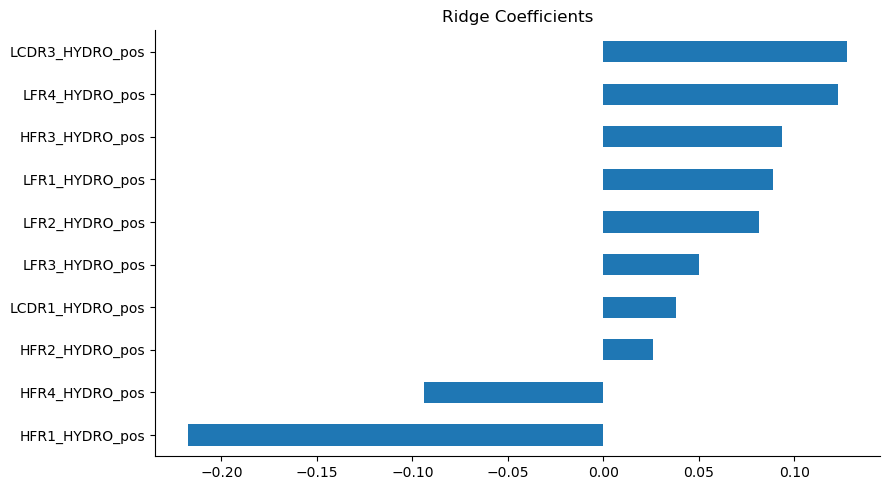

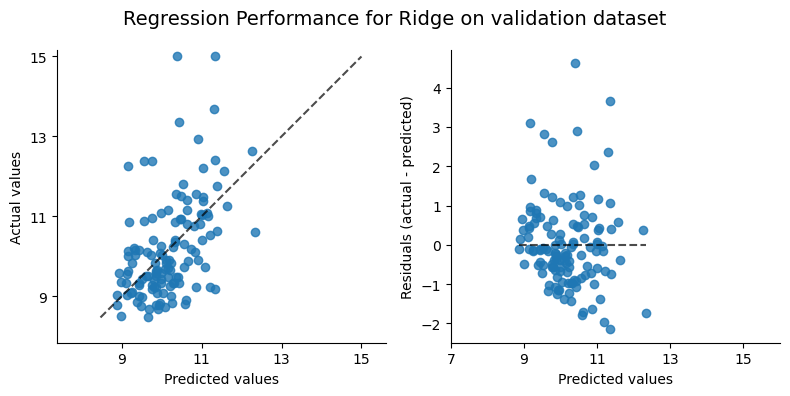

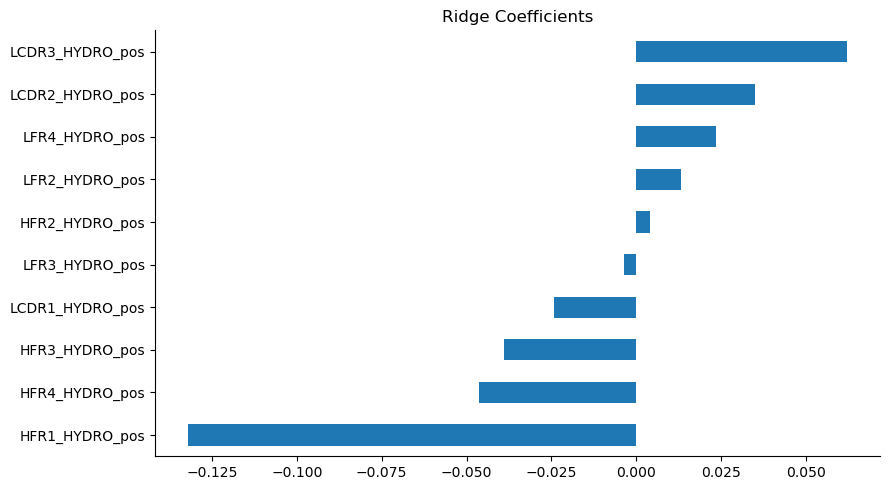

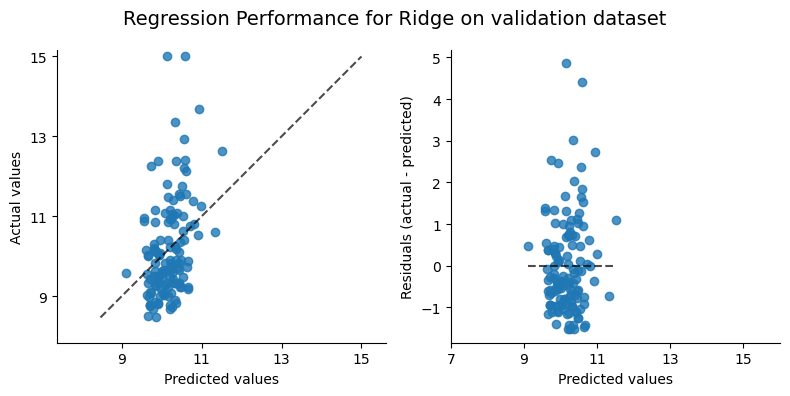

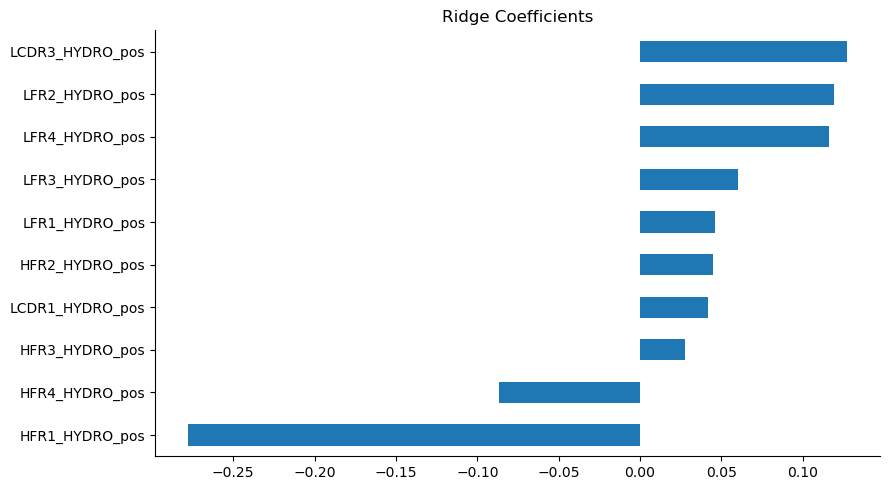

...

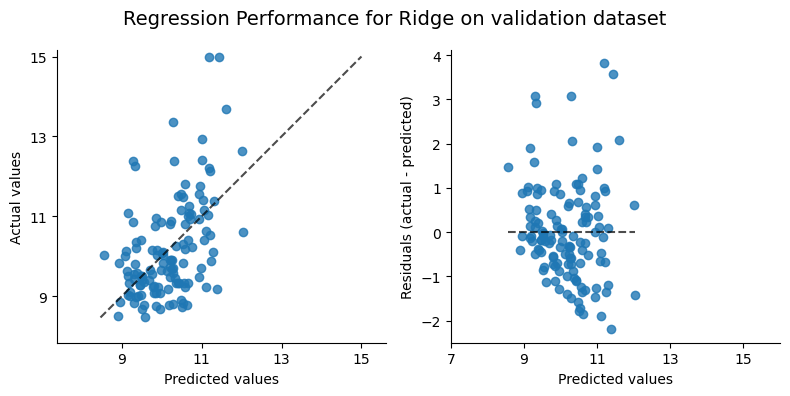

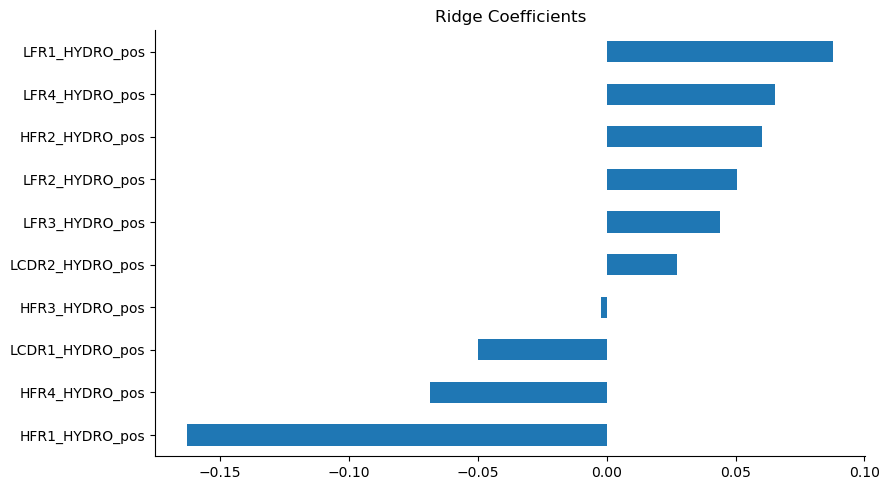

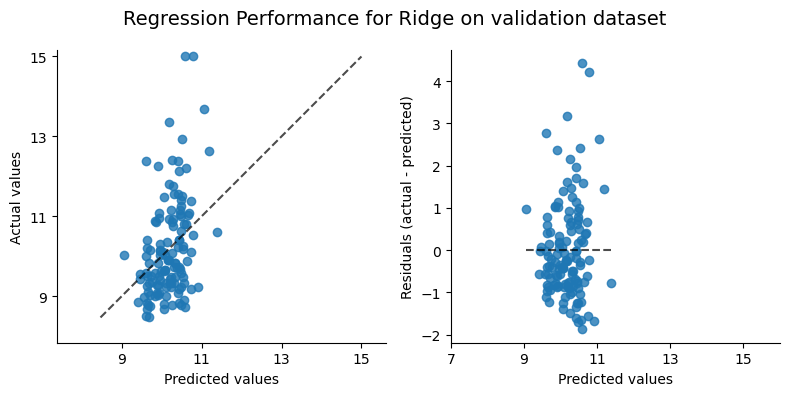

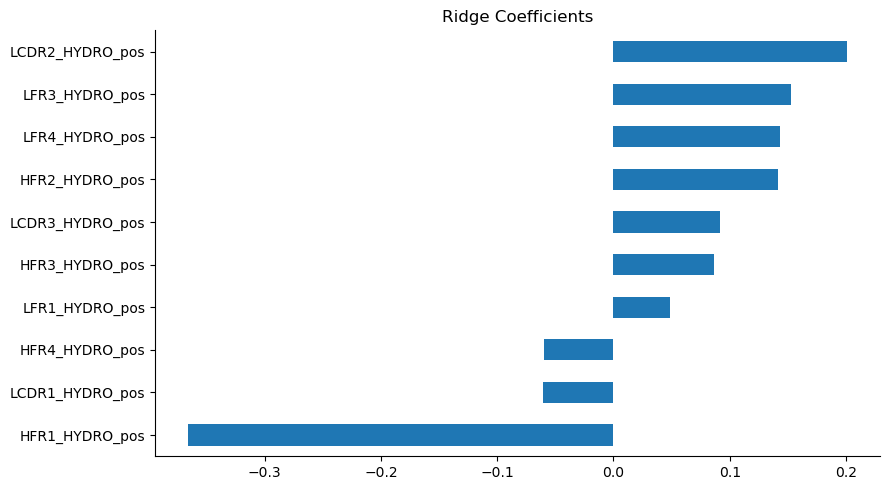

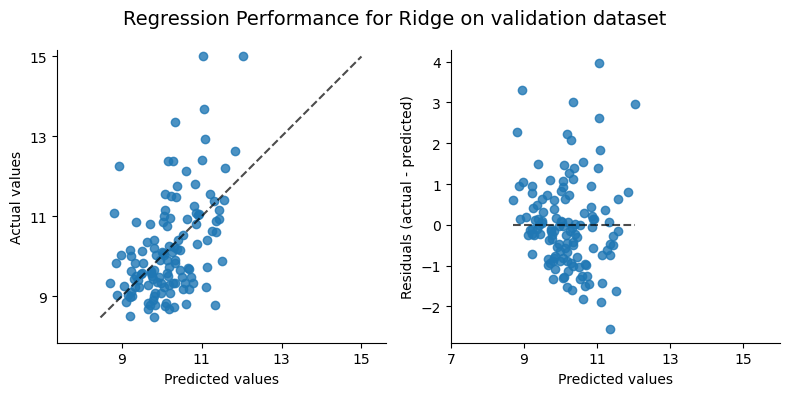

In [9]:
cols = pos_cols
l2_ridge = Ridge()
scaler = StandardScaler()
pipe = Pipeline([('scaler', scaler), ('ridge', l2_ridge)])
l2_ridge_params = {'ridge__alpha': np.logspace(-3, 3, 7)}


for method in tqdm(methods):
    for scale in scales:
        model, params, score = train_gridsearch_mlflow(pipe, l2_ridge_params, method, scale, cols, scoring=scoring)
        print(f"Best score for {method}_{scale} is {score}")

#### L1 Lasso

  0%|          | 0/3 [00:00<?, ?it/s]

Fitting 100 folds for each of 7 candidates, totalling 700 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_Ja is -1.0720243430308947
Fitting 100 folds for each of 7 candidates, totalling 700 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_WiWh is -1.0902625157803072
Fitting 100 folds for each of 7 candidates, totalling 700 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_BlMo is -1.070531608944072
Fitting 100 folds for each of 7 candidates, totalling 700 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_Ja is -1.0934005801007805
Fitting 100 folds for each of 7 candidates, totalling 700 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_WiWh is -1.1265807497894336
Fitting 100 folds for each of 7 candidates, totalling 700 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_BlMo is -1.0892048426608139
Fitting 100 folds for each of 7 candidates, totalling 700 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_Ja is -1.0934005801007805
Fitting 100 folds for each of 7 candidates, totalling 700 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_WiWh is -1.1265807497894336
Fitting 100 folds for each of 7 candidates, totalling 700 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_BlMo is -1.0892048426608139


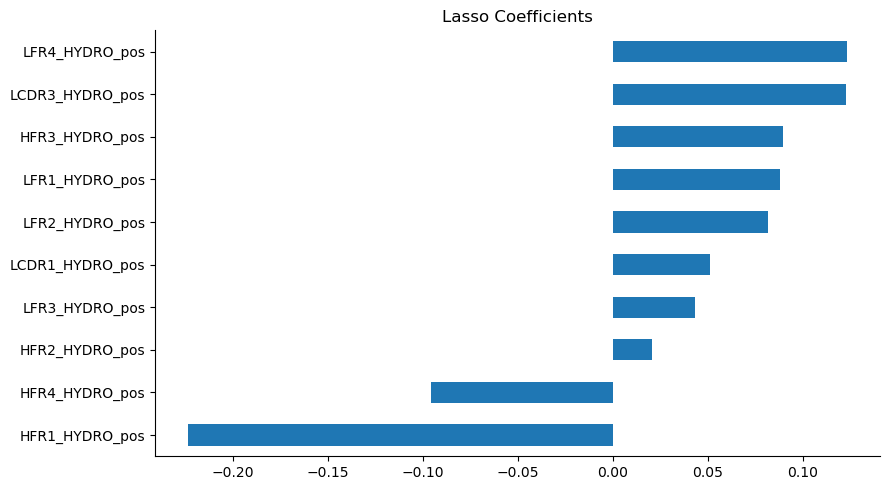

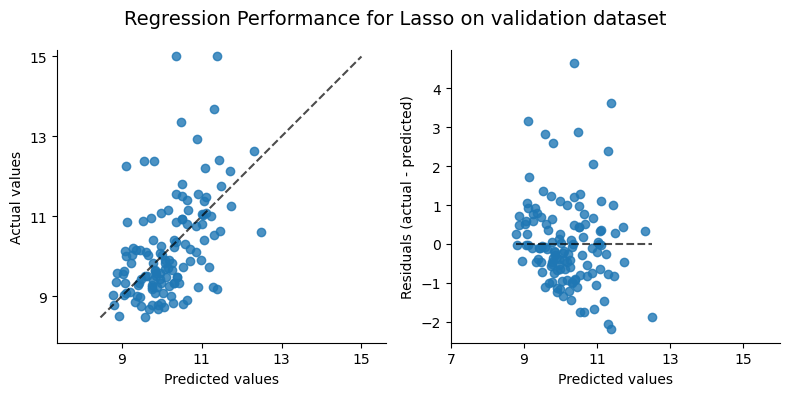

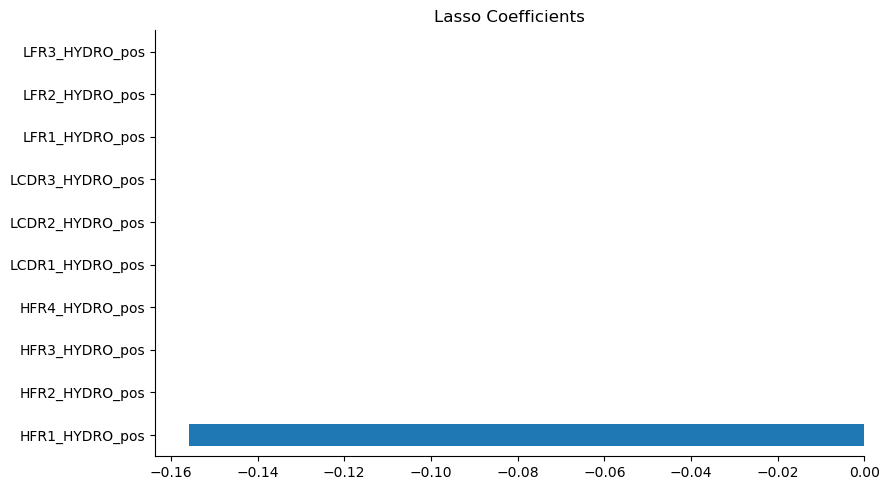

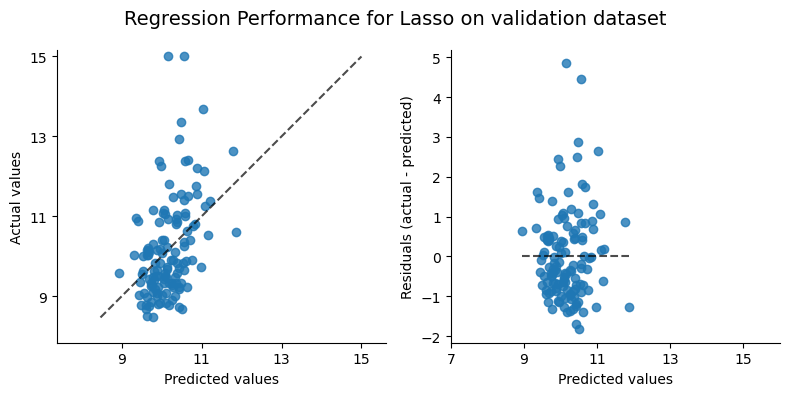

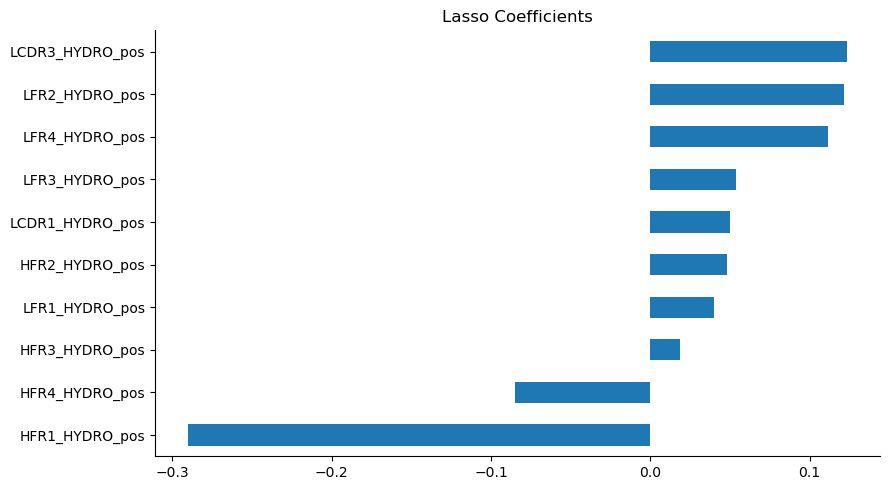

...

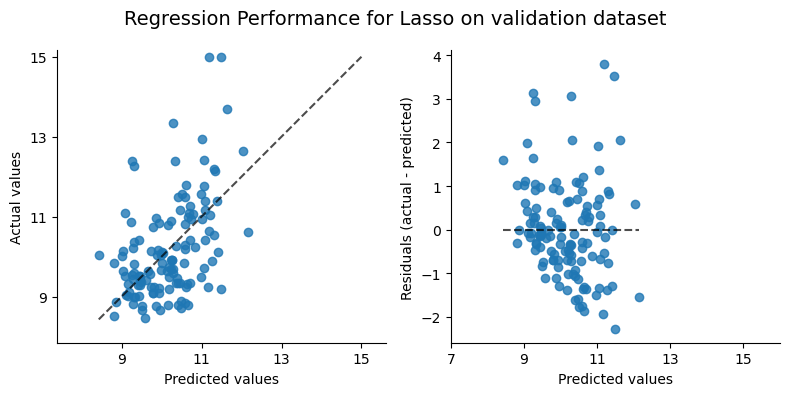

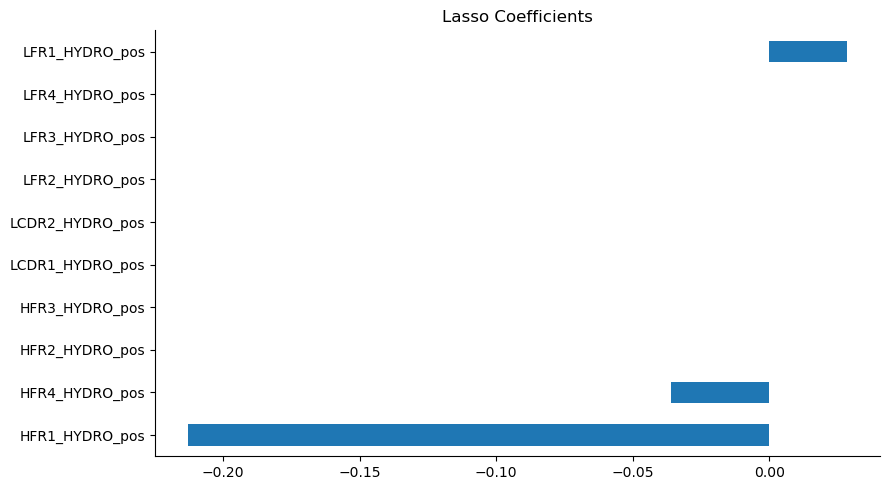

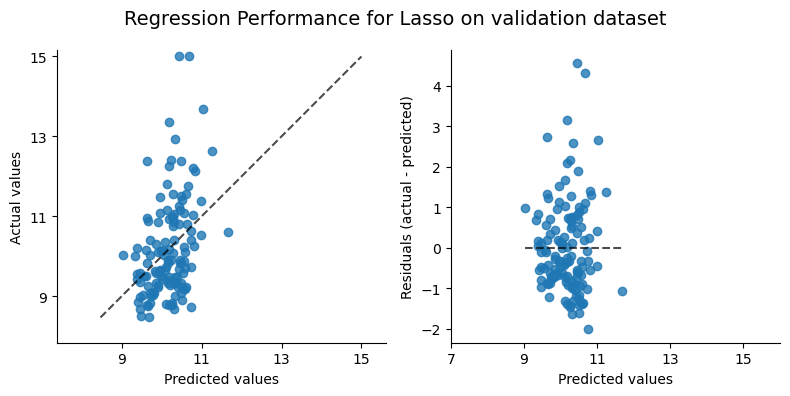

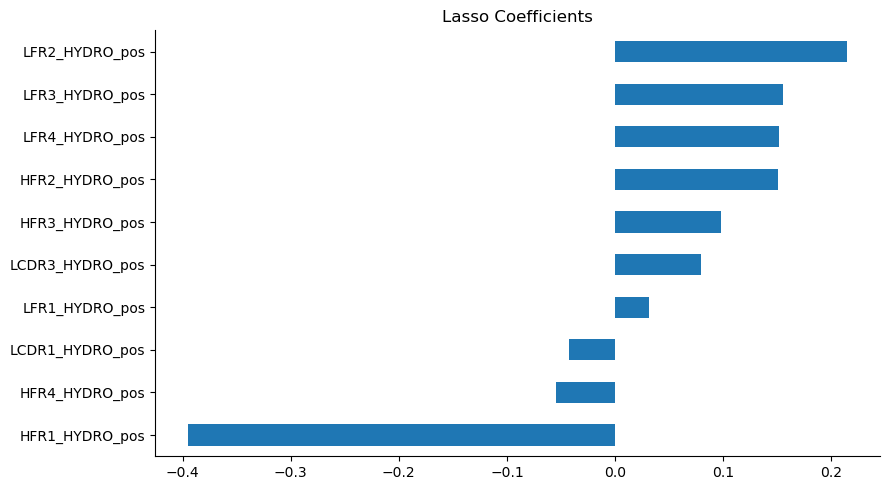

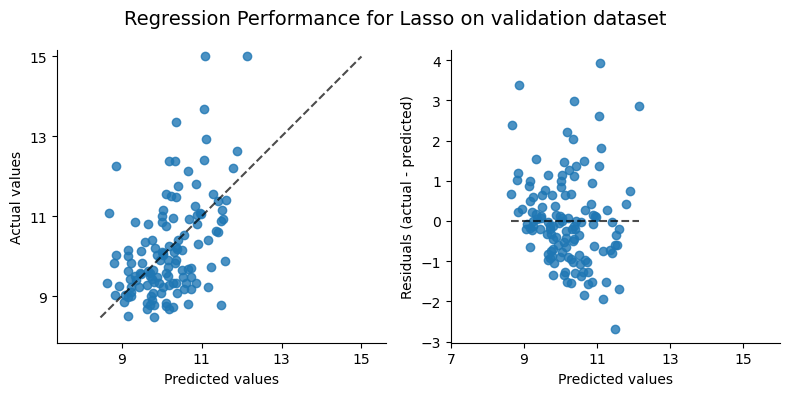

In [10]:
cols = pos_cols
l1_lasso = Lasso()
scaler = StandardScaler()
pipe = Pipeline([('scaler', scaler), ('lasso', l1_lasso)])
l1_lasso_params = {'lasso__alpha': np.logspace(-3, 3, 7)}


for method in tqdm(methods):
    for scale in scales:
        model, params, score = train_gridsearch_mlflow(pipe, l1_lasso_params, method, scale, cols, scoring=scoring)
        print(f"Best score for {method}_{scale} is {score}")

### Train elastic net

  0%|          | 0/3 [00:00<?, ?it/s]

Fitting 100 folds for each of 35 candidates, totalling 3500 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.630e+01, tolerance: 1.861e-02 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.651e+01, tolerance: 1.637e-02 Linear regression models with null weight for the l1 regularization term are more ef

Best score for mesh_Ja is -1.0607788121523098
Fitting 100 folds for each of 35 candidates, totalling 3500 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.837e+01, tolerance: 1.782e-02 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.158e+01, tolerance: 1.868e-02 Linear regression models with null weight for the l1 regularization term are more ef

Best score for mesh_WiWh is -1.0902625157803072
Fitting 100 folds for each of 35 candidates, totalling 3500 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.788e+01, tolerance: 1.888e-02 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.673e+01, tolerance: 1.764e-02 Linear regression models with null weight for the l1 regularization term are more ef

Best score for mesh_BlMo is -1.0595240971445177
Fitting 100 folds for each of 35 candidates, totalling 3500 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.578e+01, tolerance: 1.808e-02 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.835e+01, tolerance: 1.686e-02 Linear regression models with null weight for the l1 regularization term are more ef

Best score for rsa_Ja is -1.0787589691622907
Fitting 100 folds for each of 35 candidates, totalling 3500 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.656e+01, tolerance: 1.684e-02 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.337e+01, tolerance: 1.620e-02 Linear regression models with null weight for the l1 regularization term are more ef

Best score for rsa_WiWh is -1.121586367237205
Fitting 100 folds for each of 35 candidates, totalling 3500 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.576e+01, tolerance: 1.808e-02 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.326e+01, tolerance: 1.905e-02 Linear regression models with null weight for the l1 regularization term are more ef

Best score for rsa_BlMo is -1.074311998659043
Fitting 100 folds for each of 35 candidates, totalling 3500 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.571e+01, tolerance: 1.891e-02 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.622e+01, tolerance: 1.916e-02 Linear regression models with null weight for the l1 regularization term are more ef

Best score for sasa_Ja is -1.0787589691622907
Fitting 100 folds for each of 35 candidates, totalling 3500 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.670e+01, tolerance: 1.788e-02 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.263e+01, tolerance: 1.891e-02 Linear regression models with null weight for the l1 regularization term are more ef

Best score for sasa_WiWh is -1.121586367237205
Fitting 100 folds for each of 35 candidates, totalling 3500 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.326e+01, tolerance: 1.905e-02 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.665e+01, tolerance: 1.888e-02 Linear regression models with null weight for the l1 regularization term are more ef

Best score for sasa_BlMo is -1.074311998659043


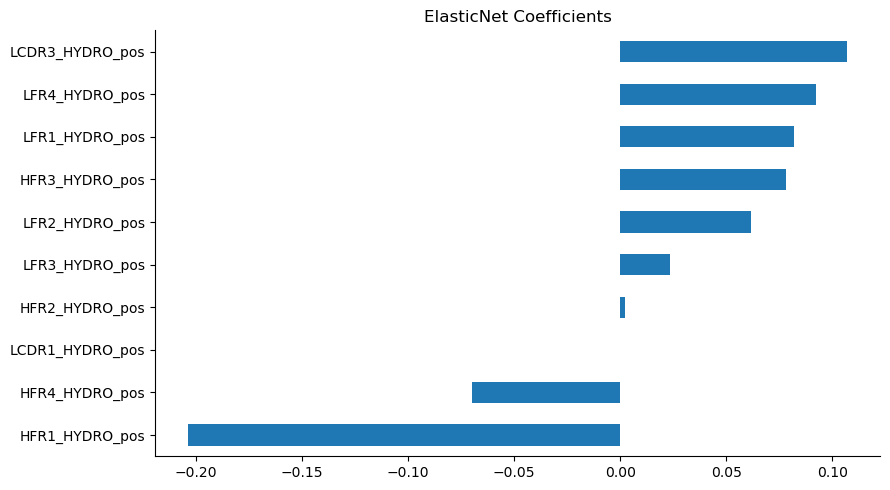

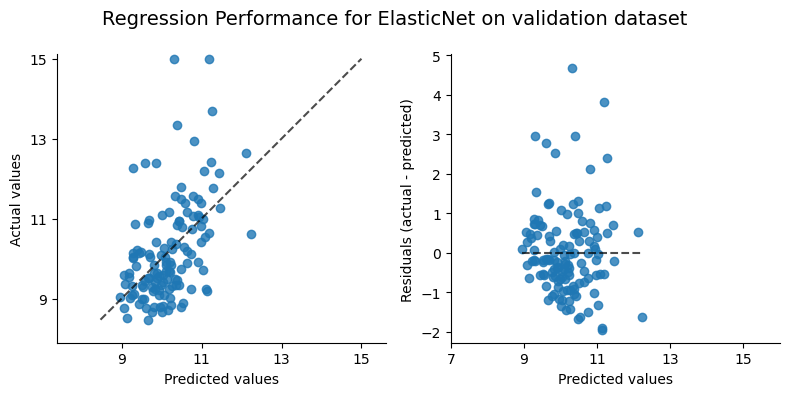

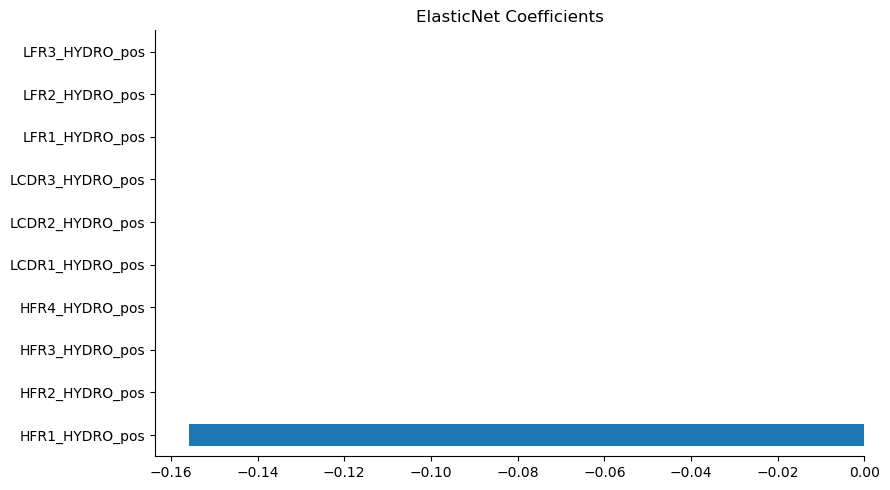

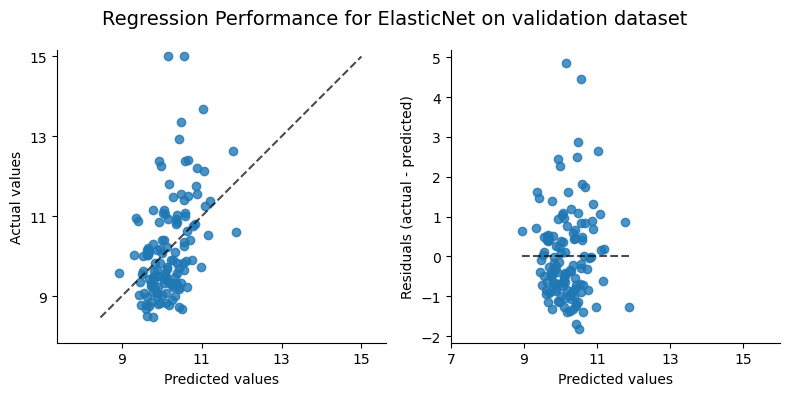

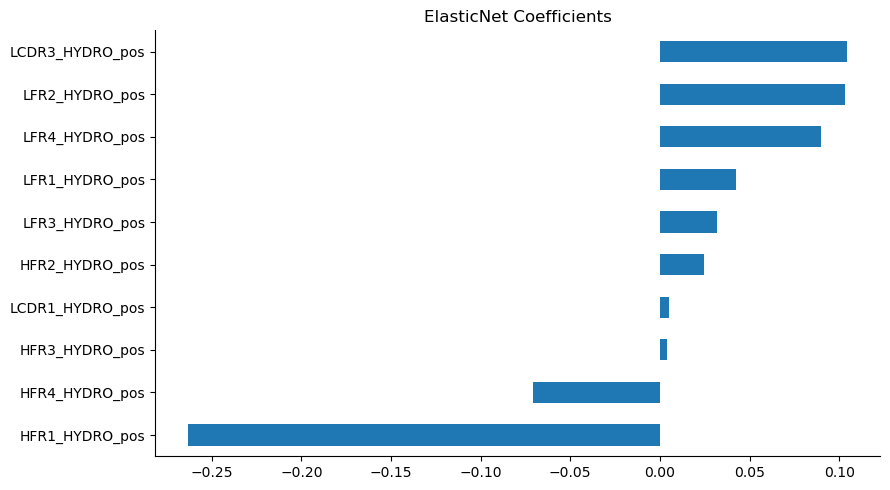

...

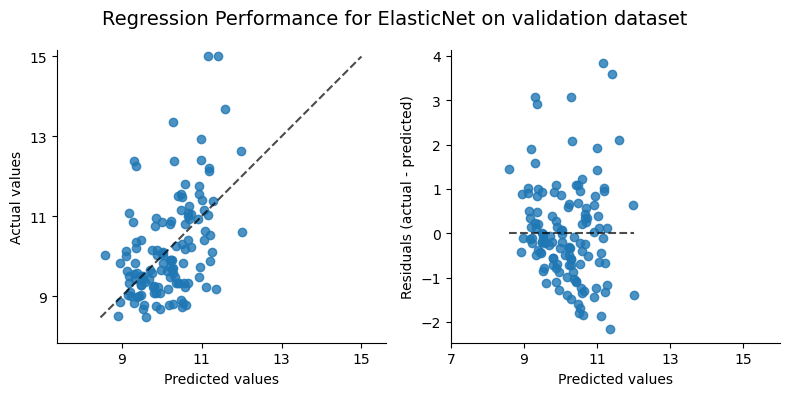

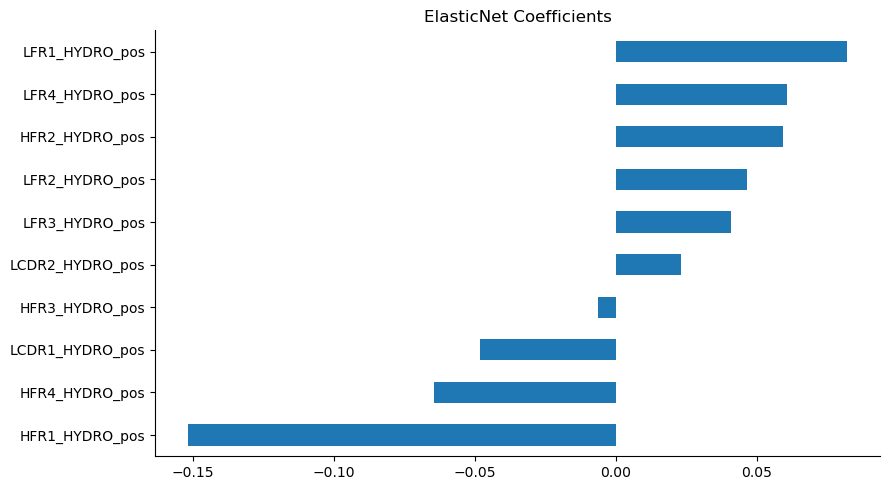

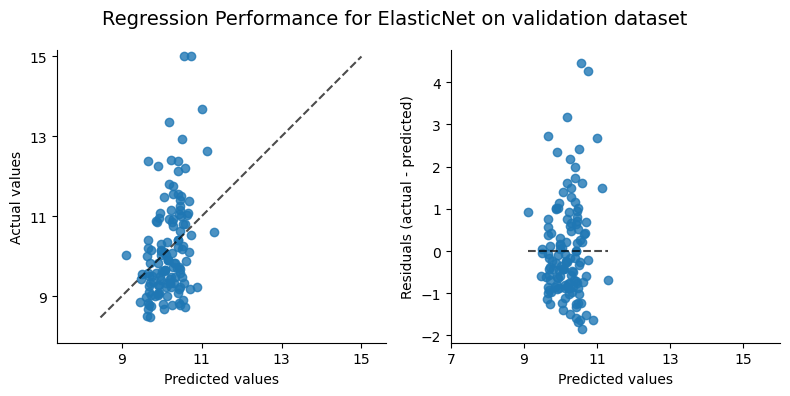

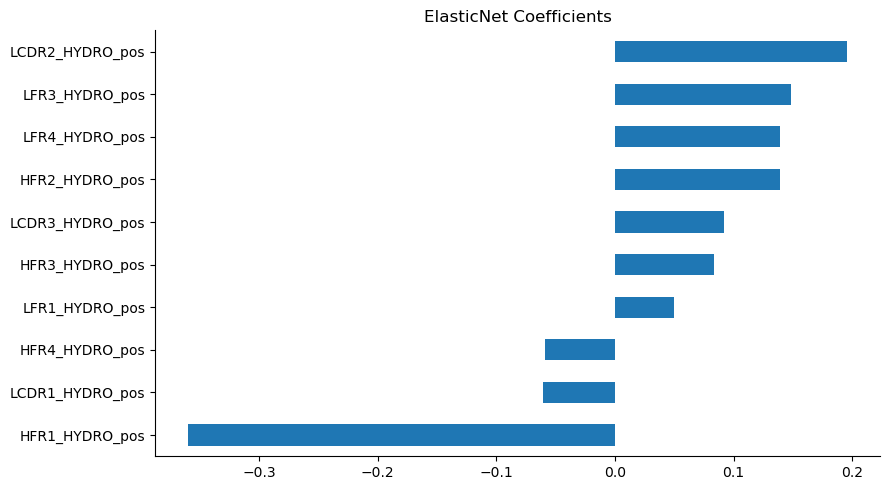

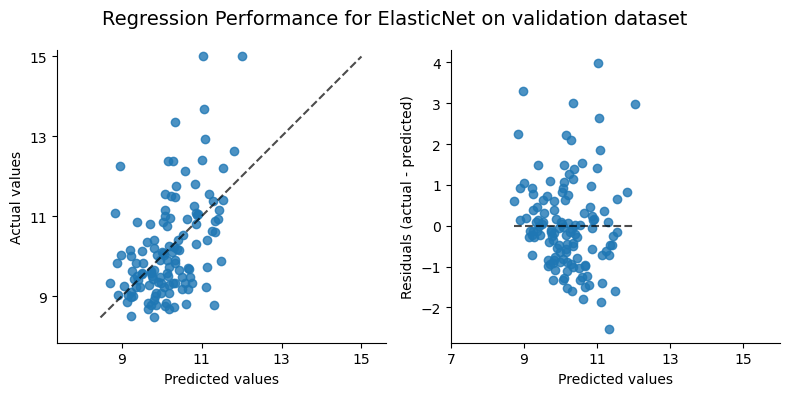

In [11]:
# train elastic net
cols = pos_cols
elastic_net = ElasticNet(max_iter = 10000)
scaler = StandardScaler()
pipe = Pipeline([('scaler', scaler), ('elastic_net', elastic_net)])
elastic_net_params = {'elastic_net__alpha': np.logspace(-3, 3, 7),
                      'elastic_net__l1_ratio': np.linspace(0,1,5)}

for method in tqdm(methods):
    for scale in scales:
        model, params, score = train_gridsearch_mlflow(pipe, elastic_net_params, method, scale, cols, scoring=scoring)
        print(f"Best score for {method}_{scale} is {score}")

### KNN

  0%|          | 0/3 [00:00<?, ?it/s]

Fitting 100 folds for each of 8 candidates, totalling 800 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_Ja is -1.0908442358738188
Fitting 100 folds for each of 8 candidates, totalling 800 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_WiWh is -1.1211235057046396
Fitting 100 folds for each of 8 candidates, totalling 800 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_BlMo is -1.0852832030818187
Fitting 100 folds for each of 8 candidates, totalling 800 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_Ja is -1.0987851216309956
Fitting 100 folds for each of 8 candidates, totalling 800 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_WiWh is -1.1206669239140985
Fitting 100 folds for each of 8 candidates, totalling 800 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_BlMo is -1.1290169252352529
Fitting 100 folds for each of 8 candidates, totalling 800 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_Ja is -1.0987851216309956
Fitting 100 folds for each of 8 candidates, totalling 800 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_WiWh is -1.1206669239140985
Fitting 100 folds for each of 8 candidates, totalling 800 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_BlMo is -1.1290169252352529


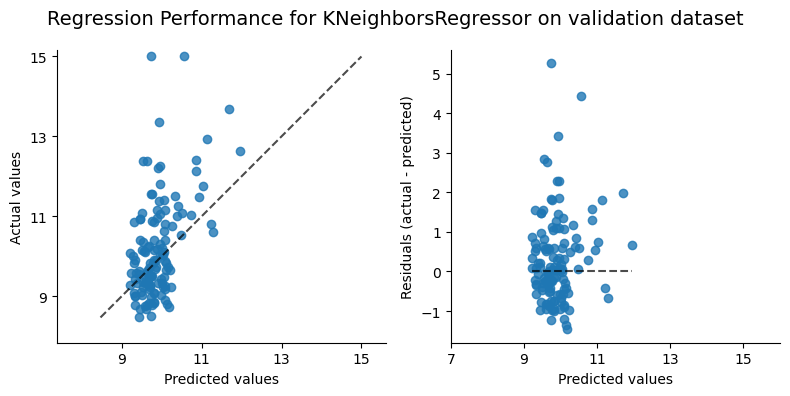

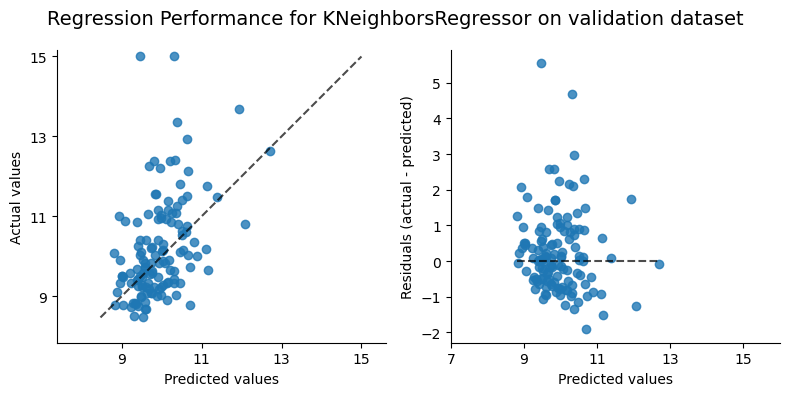

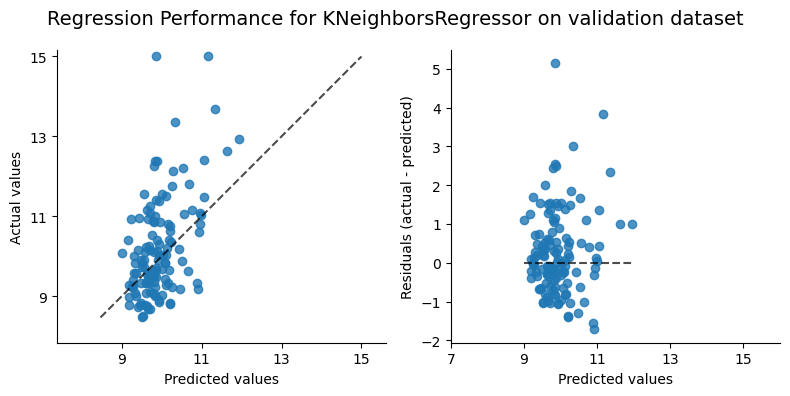

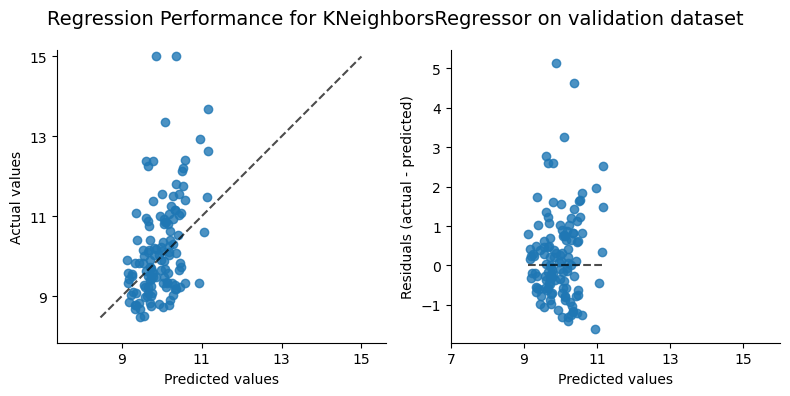

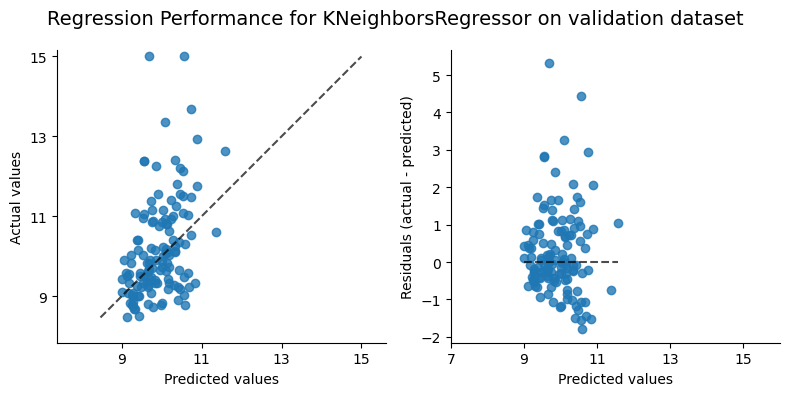

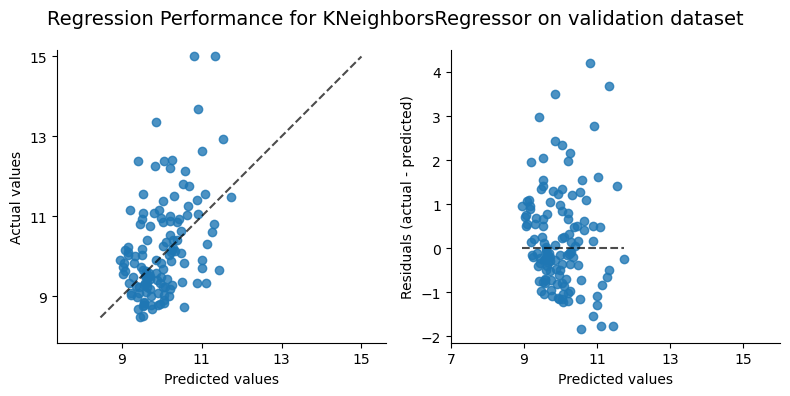

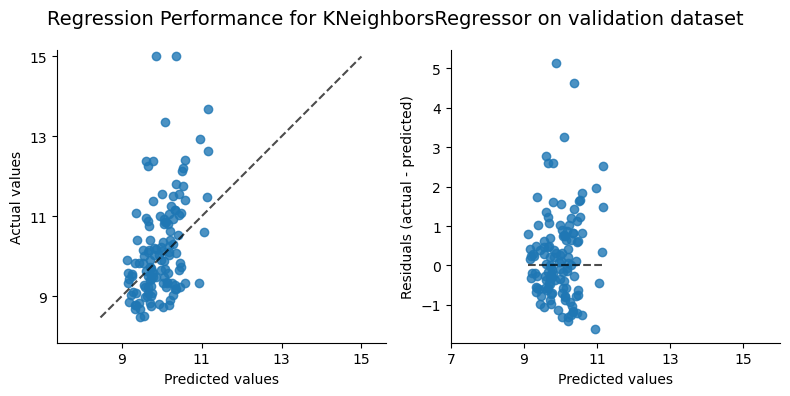

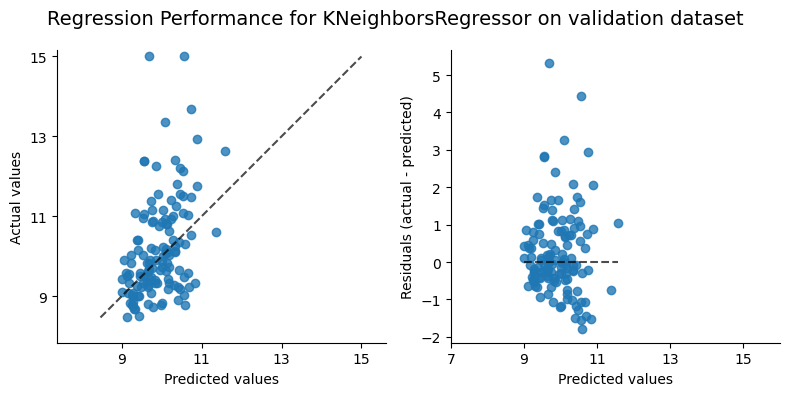

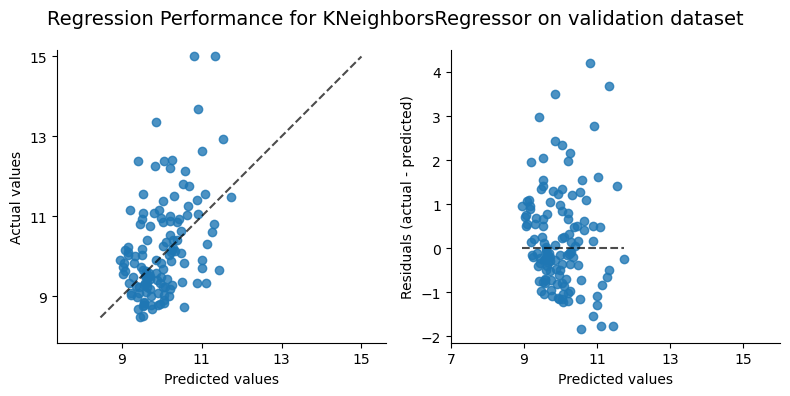

In [12]:
# train elastic net
cols = pos_cols
knn = KNeighborsRegressor()
scaler = StandardScaler()
pipe = Pipeline([('scaler', scaler), ('knn', knn)])
knn_params = {'knn__n_neighbors': [3,5,7,9], 
              'knn__weights': ['uniform', 'distance']
              }
for method in tqdm(methods):
    for scale in scales:
        model, params, score = train_gridsearch_mlflow(pipe, knn_params, method, scale, cols, scoring=scoring)
        print(f"Best score for {method}_{scale} is {score}")

### Random Forest

  0%|          | 0/3 [00:00<?, ?it/s]

Fitting 100 folds for each of 24 candidates, totalling 2400 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_Ja is -0.9809890940024643
Fitting 100 folds for each of 24 candidates, totalling 2400 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_WiWh is -1.0858778995148497
Fitting 100 folds for each of 24 candidates, totalling 2400 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_BlMo is -1.0204768626642664
Fitting 100 folds for each of 24 candidates, totalling 2400 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_Ja is -1.0681345508009952
Fitting 100 folds for each of 24 candidates, totalling 2400 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_WiWh is -1.0737879273004294
Fitting 100 folds for each of 24 candidates, totalling 2400 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_BlMo is -1.0741034108002276
Fitting 100 folds for each of 24 candidates, totalling 2400 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_Ja is -1.0681345508009952
Fitting 100 folds for each of 24 candidates, totalling 2400 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_WiWh is -1.0737879273004294
Fitting 100 folds for each of 24 candidates, totalling 2400 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_BlMo is -1.0741034108002276


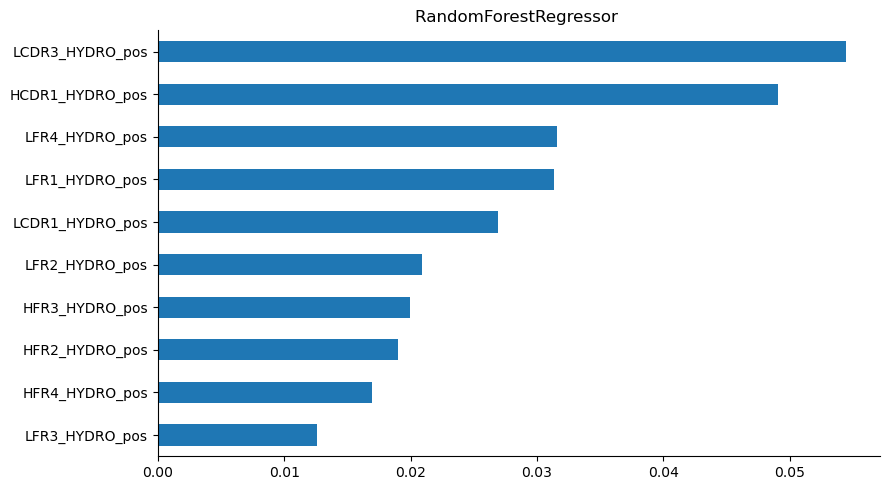

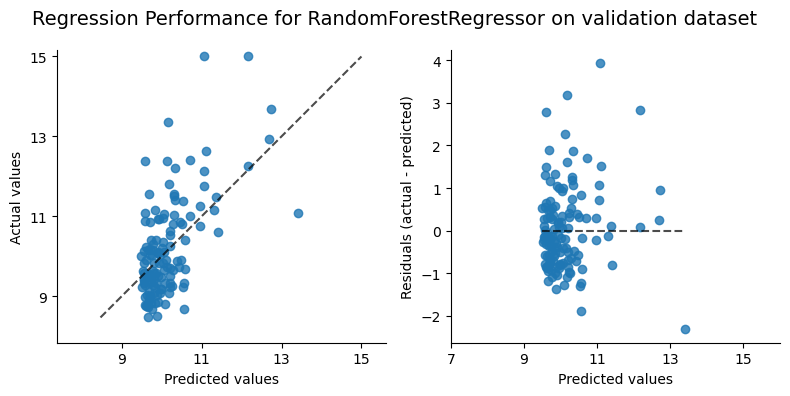

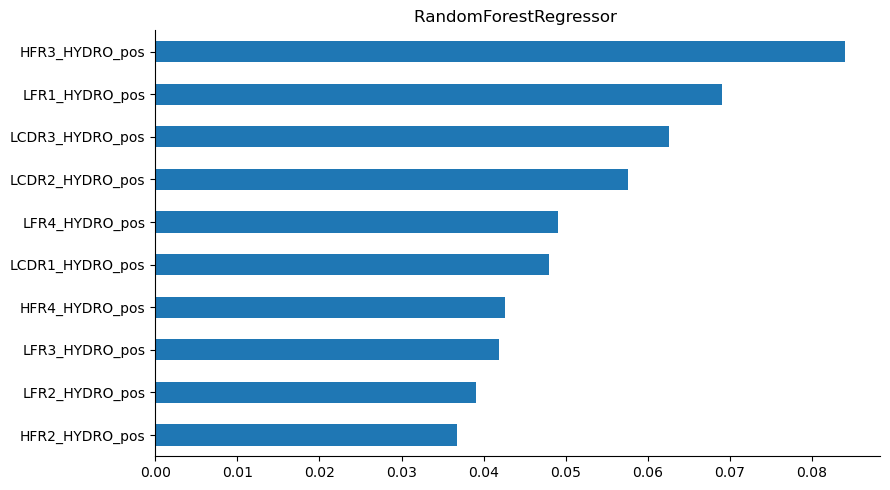

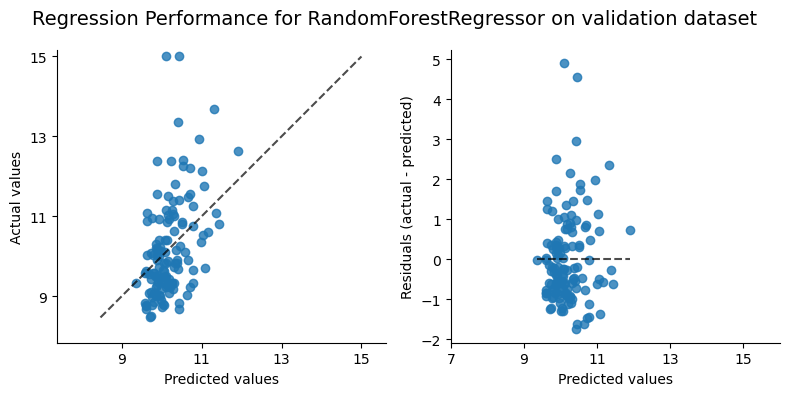

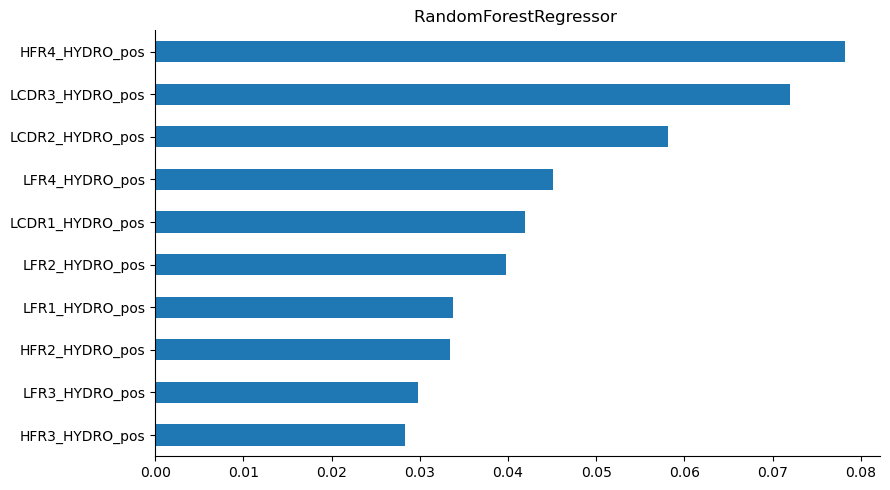

...

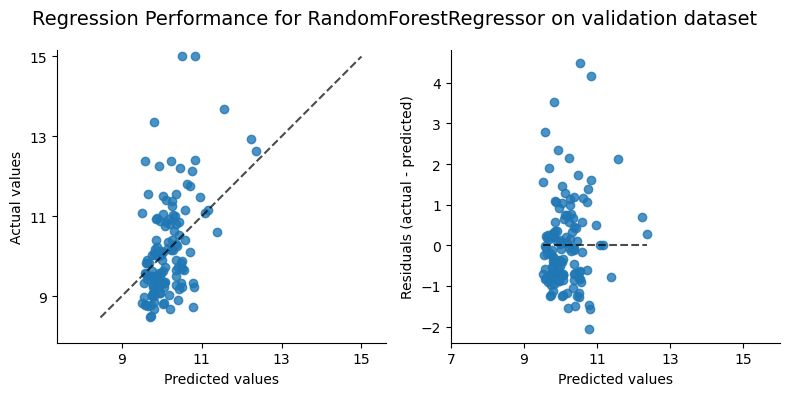

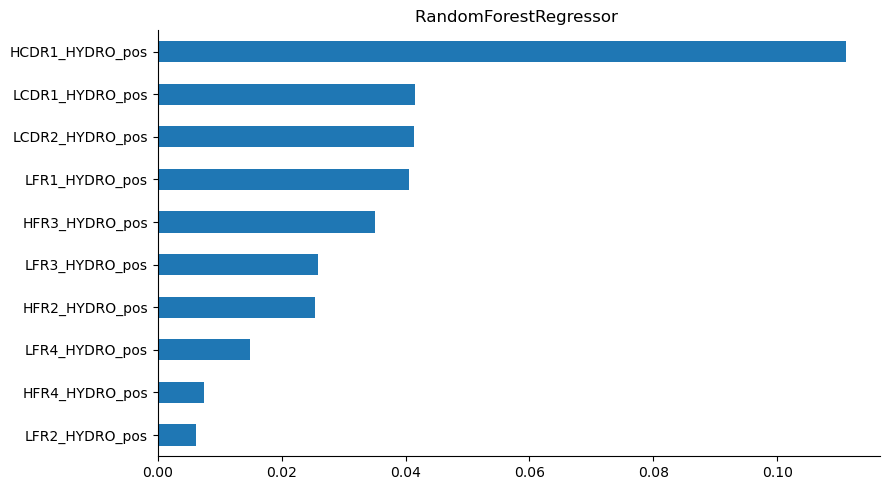

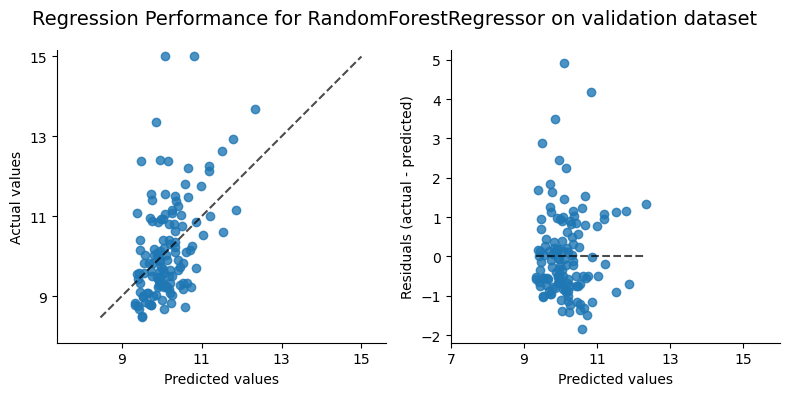

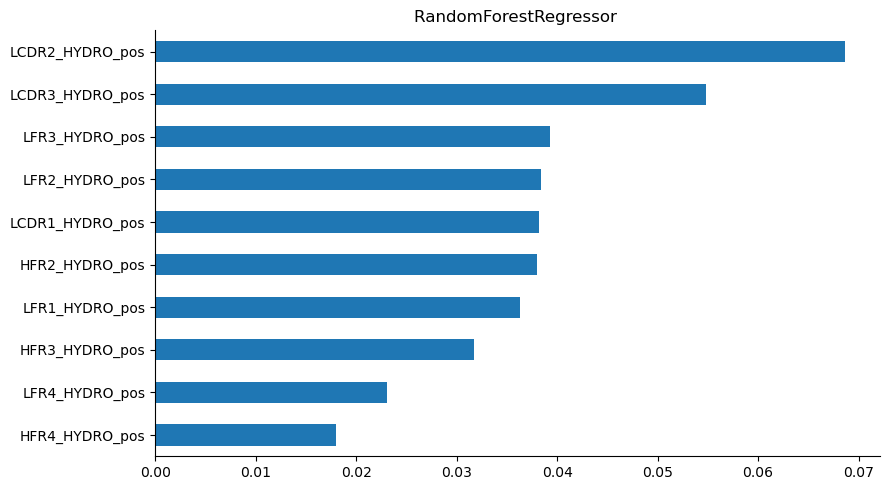

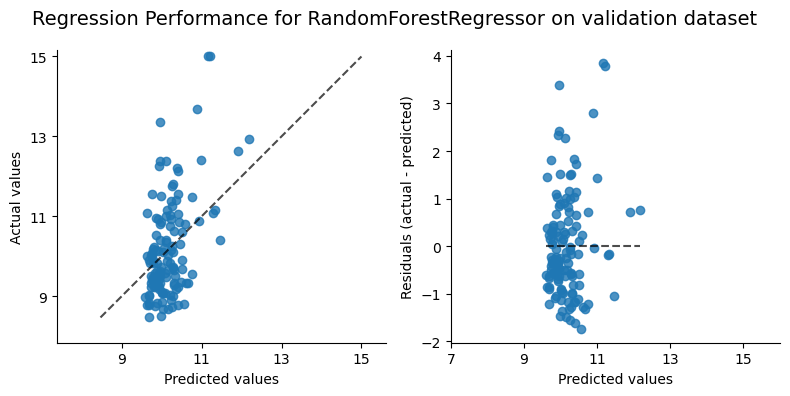

In [13]:
### train random forest regressor as above
cols = pos_cols
rf = RandomForestRegressor(random_state=32, oob_score=True)
scaler = StandardScaler()
pipe = Pipeline([('scaler', scaler), ('rf', rf)])
rf_params = {'rf__n_estimators': [100, 200],
             'rf__max_depth': [3, 4, 5, 6],
             'rf__max_features': [1.0, 'sqrt', 'log2']}

for method in tqdm(methods):
    for scale in scales:
        model, params, score = train_gridsearch_mlflow(pipe, rf_params, method, scale, cols, scoring=scoring)
        print(f"Best score for {method}_{scale} is {score}")


### Try with single feature for Linear Regression 

Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_Ja is -1.0796035519719451
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_WiWh is -1.1348261541246918
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_BlMo is -1.0744261363932244
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_Ja is -1.0962838398016044
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_WiWh is -1.1552530651830888
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_BlMo is -1.0927395870441032
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_Ja is -1.0962838398016044
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_WiWh is -1.1552530651830888
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_BlMo is -1.0927395870441032


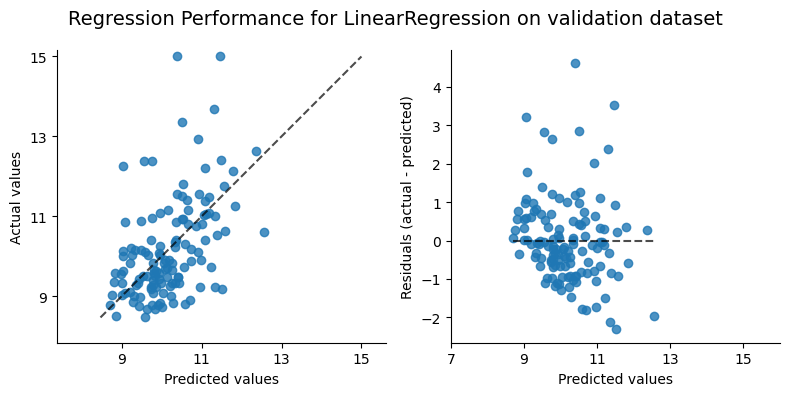

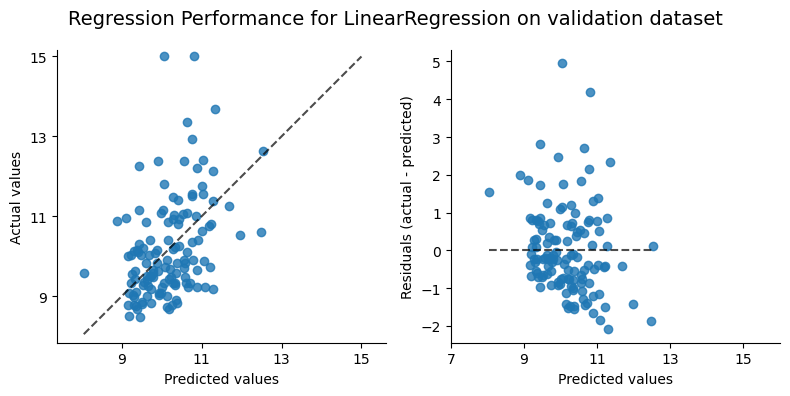

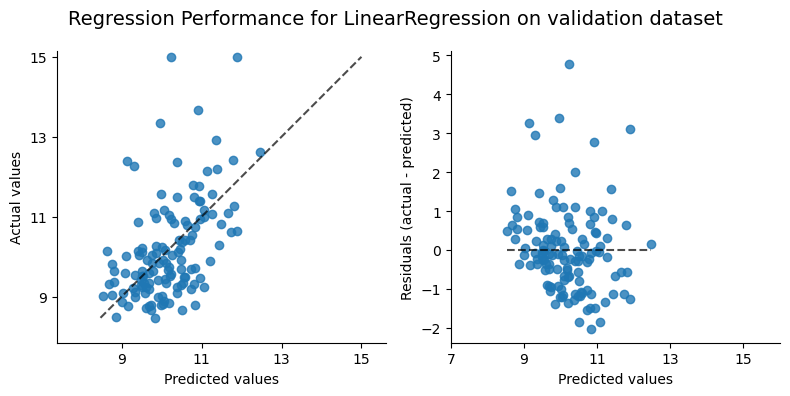

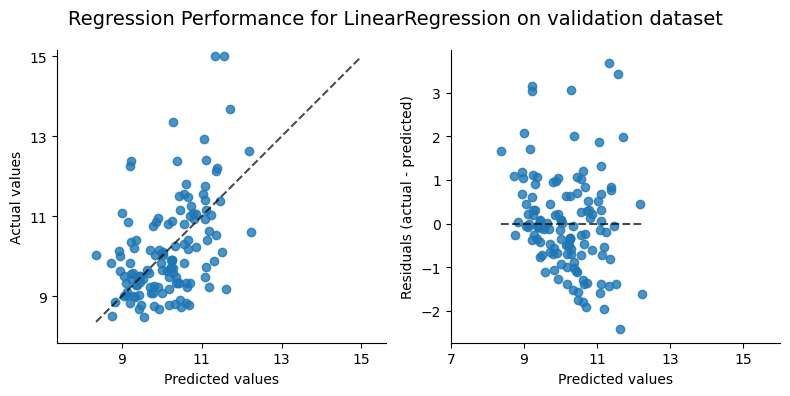

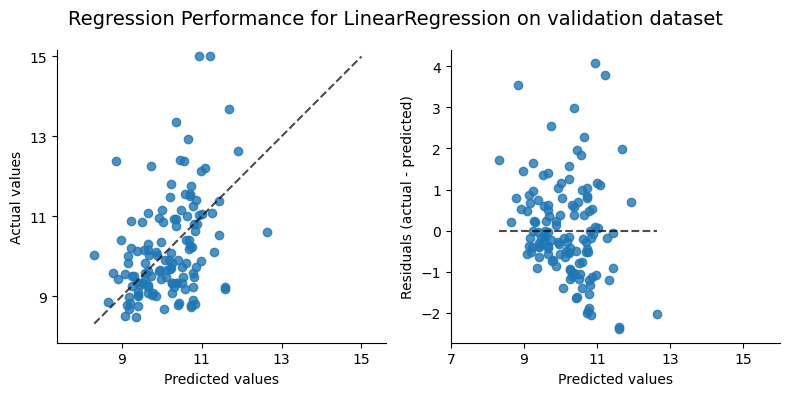

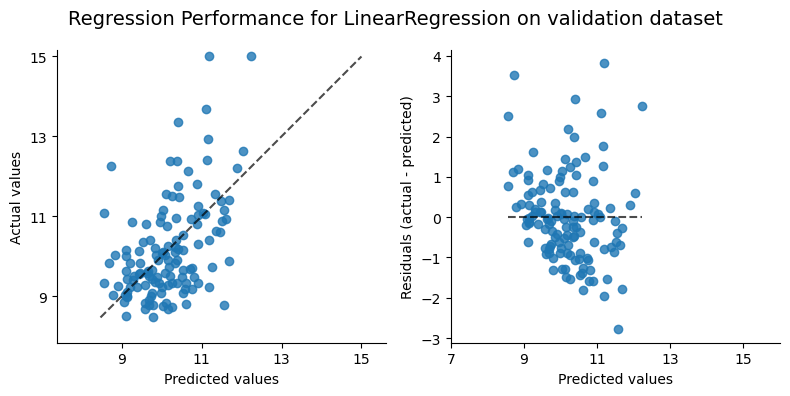

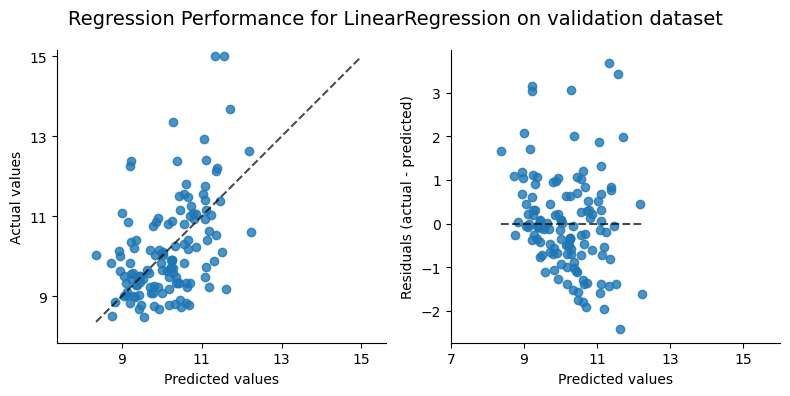

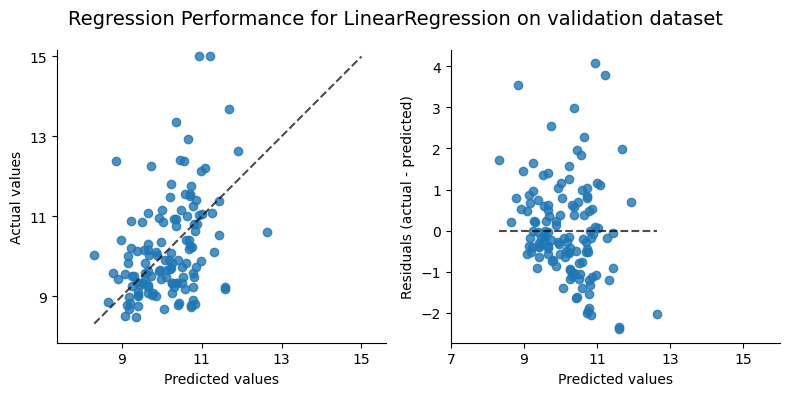

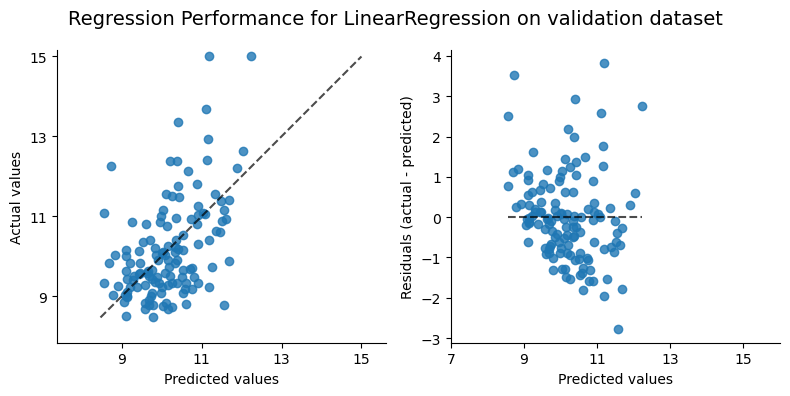

In [14]:
lr = LinearRegression()
params = {}

for method in methods: 
    for scale in scales:
        model, params, score = train_gridsearch_mlflow(lr, params, method, scale, cols, scoring=scoring)
        print(f"Best score for {method}_{scale} is {score}")

Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_Ja is -1.1951836080685778
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_Ja is -1.165563815749438
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_Ja is -1.1474877775070278
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_Ja is -1.213523144856445
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_Ja is -1.2310181879696798
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_Ja is -1.2255583962717957
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_Ja is -1.2287390719902114
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_Ja is -1.2189606930328172
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_Ja is -1.2339066501658218
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_Ja is -1.2149243688805147
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_Ja is -1.2237421813269884
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_Ja is -1.222533917463358
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_Ja is -1.2270350948152147
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_Ja is -1.2169882763364996
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_WiWh is -1.2045348617513958
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_WiWh is -1.1906565735588175
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_WiWh is -1.139068117530251
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_WiWh is -1.2123600502558294
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_WiWh is -1.230405680947716
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_WiWh is -1.2303639475049415
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/Projects/developability/developability/modeling.py:140: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(nrows=1, ncols=2, figsize=figsize)
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/Christoph

Best score for mesh_WiWh is -1.2288984394981148
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_WiWh is -1.222174735702679
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_WiWh is -1.2333858340130974
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_WiWh is -1.2191135860055475
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_WiWh is -1.2214680947324112
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_WiWh is -1.2252507533278725
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_WiWh is -1.2262104692788578
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_WiWh is -1.2297476771959719
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_BlMo is -1.1943024499687602
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_BlMo is -1.1591978048540472
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_BlMo is -1.160789897339485
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_BlMo is -1.2083942913518284
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_BlMo is -1.2291207247942308
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_BlMo is -1.2282059658085116
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_BlMo is -1.2295609858474115
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_BlMo is -1.2211820536314006
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_BlMo is -1.2331199296175601
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_BlMo is -1.2164155543056807
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_BlMo is -1.2220700178726884
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_BlMo is -1.2202494654142155
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_BlMo is -1.2265717972660546
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for mesh_BlMo is -1.2044110518240363
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_Ja is -1.2053813333064551
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_Ja is -1.177297392045849
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_Ja is -1.1642930621465721
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_Ja is -1.2022656240346776
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_Ja is -1.2193884471425496
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_Ja is -1.2276639757908552
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_Ja is -1.231399285075443
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_Ja is -1.2263850938242506
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_Ja is -1.234566183363878
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_Ja is -1.2146992543982293
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_Ja is -1.223102853426549
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_Ja is -1.2137156097414454
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_Ja is -1.2277745822144737
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_Ja is -1.2199418372875879
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_WiWh is -1.2163511838621839
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_WiWh is -1.1991107188020942
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_WiWh is -1.156253699701021
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_WiWh is -1.201446588533161
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_WiWh is -1.2039827644142123
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_WiWh is -1.222251120693844
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_WiWh is -1.2273827532887283
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_WiWh is -1.2220977596760667
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_WiWh is -1.2333009888976356
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_WiWh is -1.2186471667468128
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_WiWh is -1.2189505581998143
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_WiWh is -1.2188379664785949
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_WiWh is -1.2263553992842404
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_WiWh is -1.2204417913769183
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_BlMo is -1.210294373894169
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_BlMo is -1.1851793533523525
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_BlMo is -1.1717576074700822
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_BlMo is -1.1921558750435977
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_BlMo is -1.2306406602804965
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_BlMo is -1.2262738516422407
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_BlMo is -1.2322163222507665
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_BlMo is -1.2270569758079442
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_BlMo is -1.2318711545690784
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_BlMo is -1.2200235027768846
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_BlMo is -1.2225188580006563
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_BlMo is -1.2073704352020456
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_BlMo is -1.2277522547289819
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for rsa_BlMo is -1.216160667873867
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_Ja is -1.2053813333064551
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_Ja is -1.177297392045849
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_Ja is -1.1642930621465721
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_Ja is -1.2022656240346776
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_Ja is -1.2193884471425496
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_Ja is -1.2276639757908552
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_Ja is -1.231399285075443
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_Ja is -1.2263850938242506
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_Ja is -1.234566183363878
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_Ja is -1.2146992543982293
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_Ja is -1.223102853426549
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_Ja is -1.2137156097414454
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_Ja is -1.2277745822144737
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_Ja is -1.2199418372875879
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_WiWh is -1.2163511838621839
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_WiWh is -1.1991107188020942
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_WiWh is -1.156253699701021
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_WiWh is -1.201446588533161
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_WiWh is -1.2039827644142123
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_WiWh is -1.222251120693844
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_WiWh is -1.2273827532887283
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_WiWh is -1.2220977596760667
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_WiWh is -1.2333009888976356
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_WiWh is -1.2186471667468128
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_WiWh is -1.2189505581998143
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_WiWh is -1.2188379664785949
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_WiWh is -1.2263553992842404
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_WiWh is -1.2204417913769183
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_BlMo is -1.210294373894169
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_BlMo is -1.1851793533523525
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_BlMo is -1.1717576074700822
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_BlMo is -1.1921558750435977
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_BlMo is -1.2306406602804965
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_BlMo is -1.2262738516422407
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_BlMo is -1.2322163222507665
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_BlMo is -1.2270569758079442
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_BlMo is -1.2318711545690784
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_BlMo is -1.2200235027768846
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_BlMo is -1.2225188580006563
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_BlMo is -1.2073704352020456
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_BlMo is -1.2277522547289819
Fitting 100 folds for each of 1 candidates, totalling 100 fits


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


Best score for sasa_BlMo is -1.216160667873867


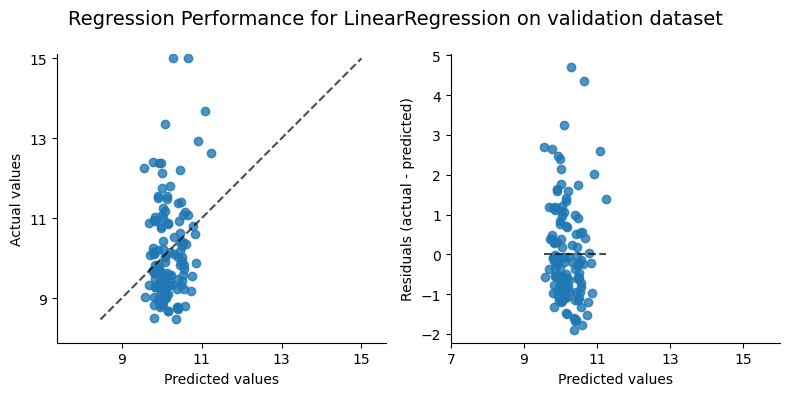

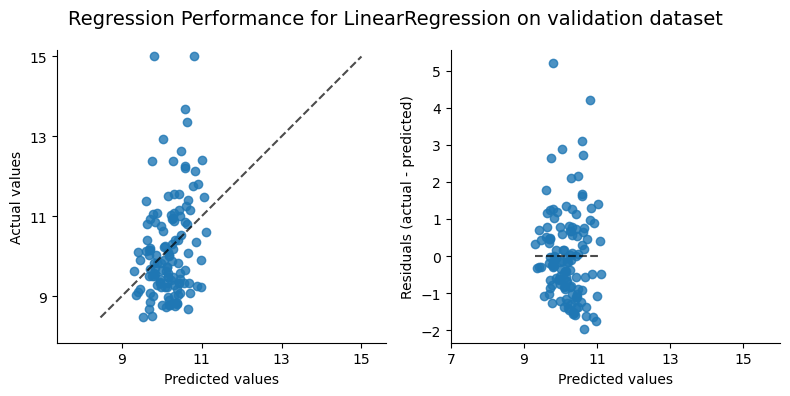

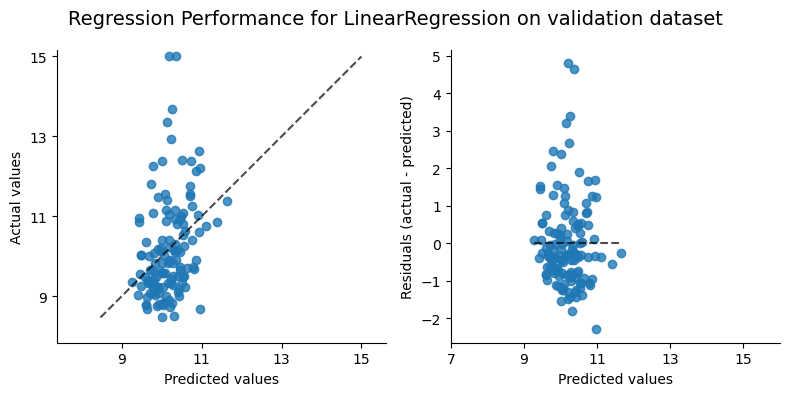

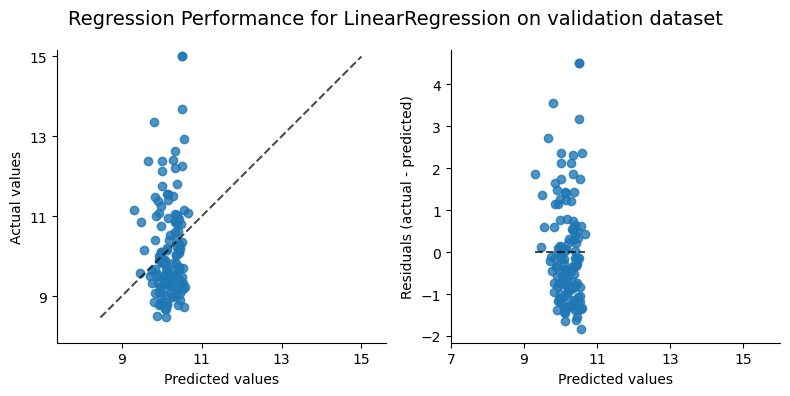

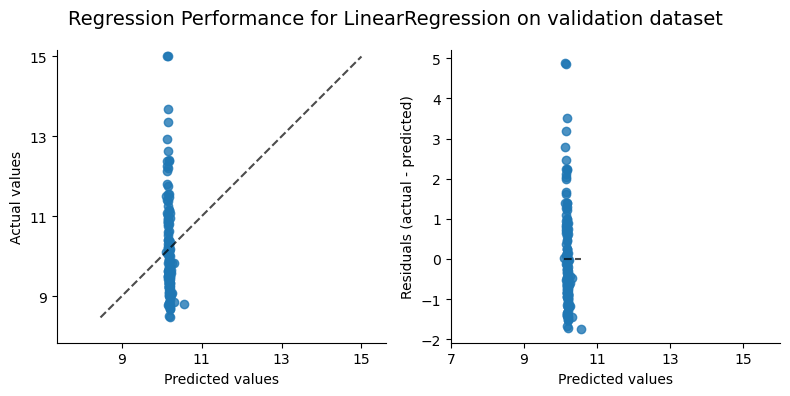

...

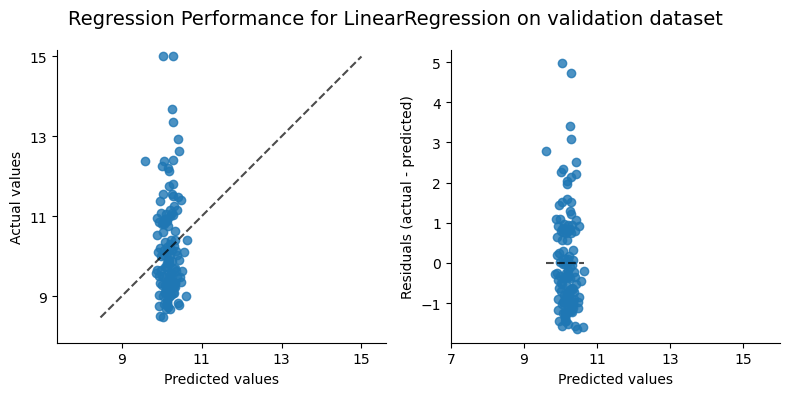

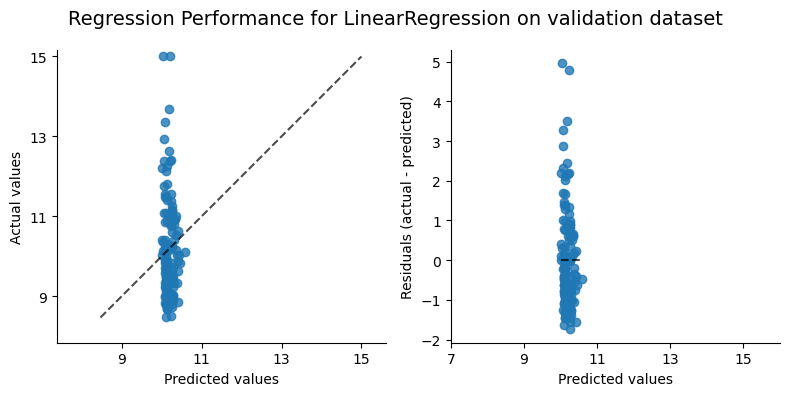

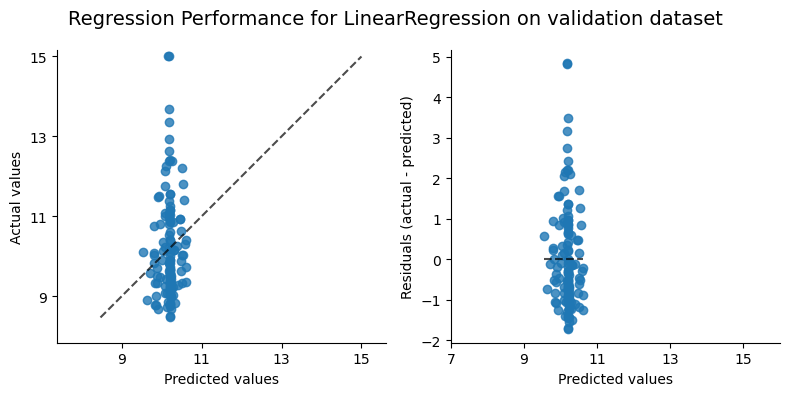

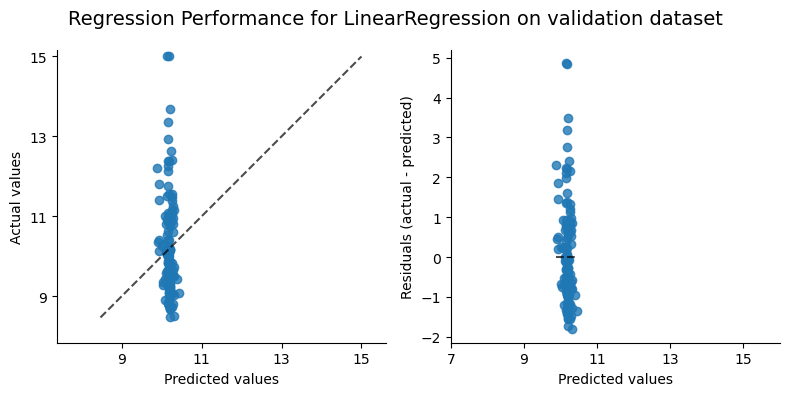

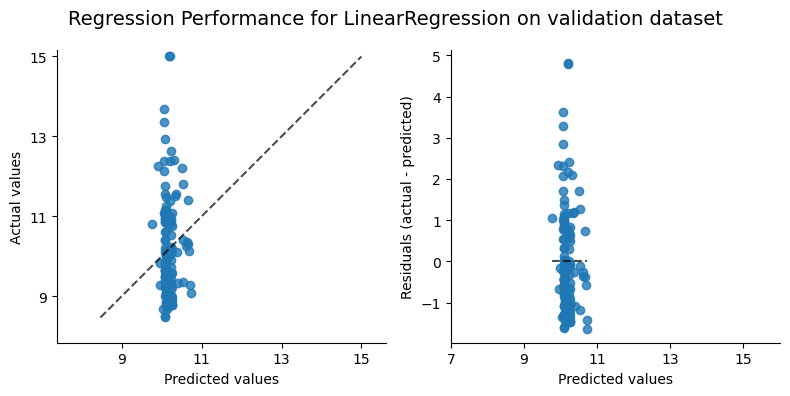

In [15]:
lr = LinearRegression()
params = {}

for method in methods: 
    for scale in scales:
        for feature in cols:
            model, params, score = train_gridsearch_mlflow(lr, params, method, scale, [feature], scoring=scoring)
            print(f"Best score for {method}_{scale} is {score}")

#### Conclusions

This does seems to give me realy unexpected performance. I am going to try one more thing. Rather than just do simple Kfold CV, I will bin the data and then do stratified k fold on the data. 